# Morphology Module: Part 3 for CNS tutorial
----

*Load morphologies that were downloaded, analyze them, and compare species.*

For the first part of the tutorial, the user downloaded 20 mouse morphologies, 20 rat morphologies, and 20 human morphologies. We saved these neurons locally in two different folders. In the second part, we extracted basic morphometrics. The data will now be used for the topological analysis between mouse, rat, and human. We will visualize some example morphologies, and we will use TMD for the topological comparison of the species. We will also create a topological embedding to demonstrate the differences between the species.  

## 3.1 Use TMD to load morphologies

We will use TMD (https://github.com/openbraininstitute/TMD) for the topological analysis of the morphologies. This is a user-friendly tool to download morphologies, visualize them quickly and extract topological properties similar to the morphological properties that we extracted with NeuroM. For more details, the complete documentation of the tool can be found: https://tmd.readthedocs.io/en/latest/?badge=latest.

In [1]:
%matplotlib inline

import tmd
from tmd.view import view, plot
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600

In [2]:
Rat_morphologies = tmd.io.load_population('Rat/', use_morphio=True)

In [3]:
Mouse_morphologies = tmd.io.load_population('Mouse/', use_morphio=True)

In [4]:
Human_morphologies = tmd.io.load_population('Human/', use_morphio=True)

## 3.2 Plot morphologies

Here we visualize some example morphologies we downloaded. This visualization is for illustration purposes only, exploring our data. It is not meant to be used for a proper scientific paper ready figure. 

In [5]:
rat_neuron = Rat_morphologies.neurons[0]

mouse_neuron = Mouse_morphologies.neurons[0]

human_neuron = Human_morphologies.neurons[0]

(<Figure size 3840x2880 with 1 Axes>,
 <Axes: title={'center': 'Human/1204_H42_02.swc'}, xlabel='x', ylabel='y'>)

<Figure size 7200x4800 with 0 Axes>

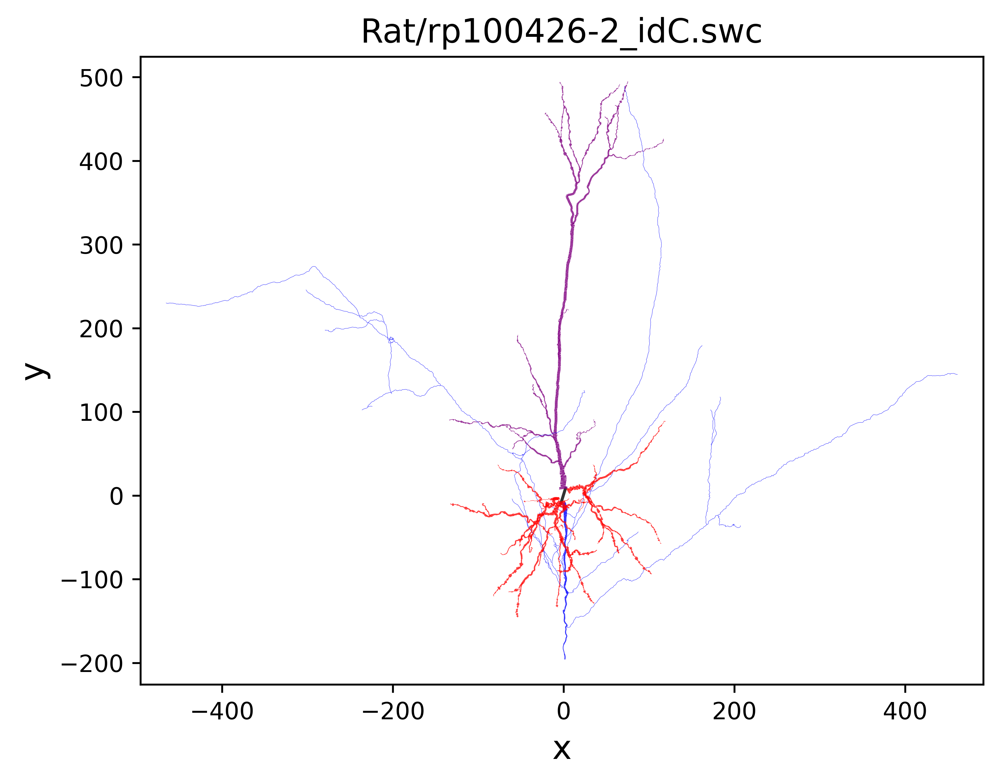

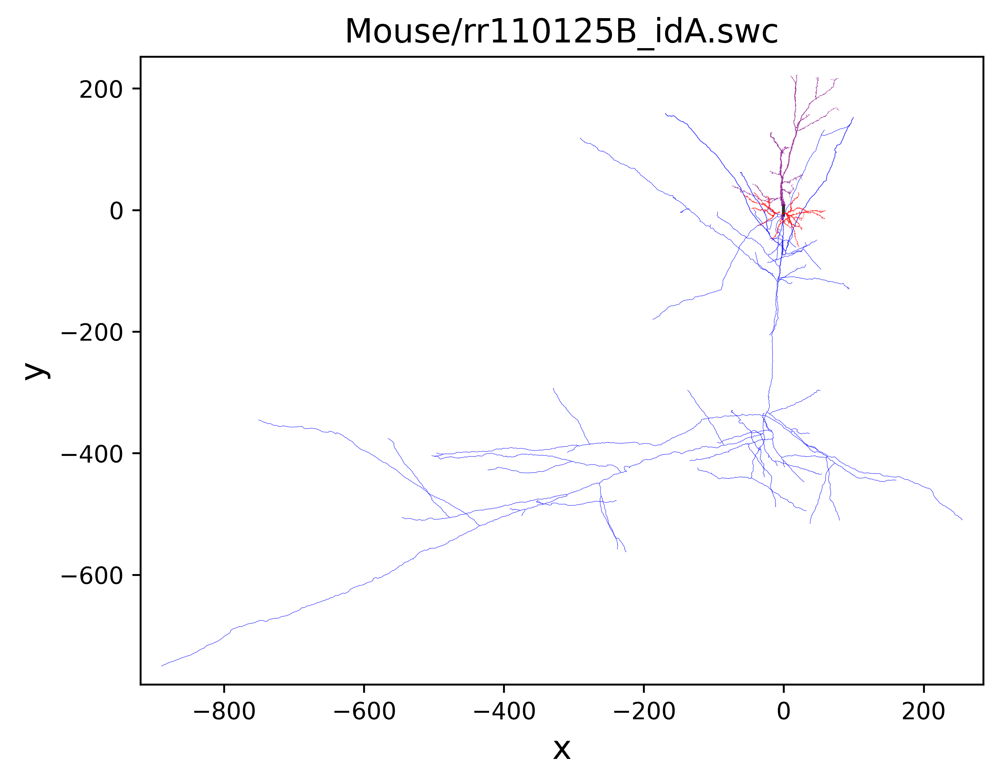

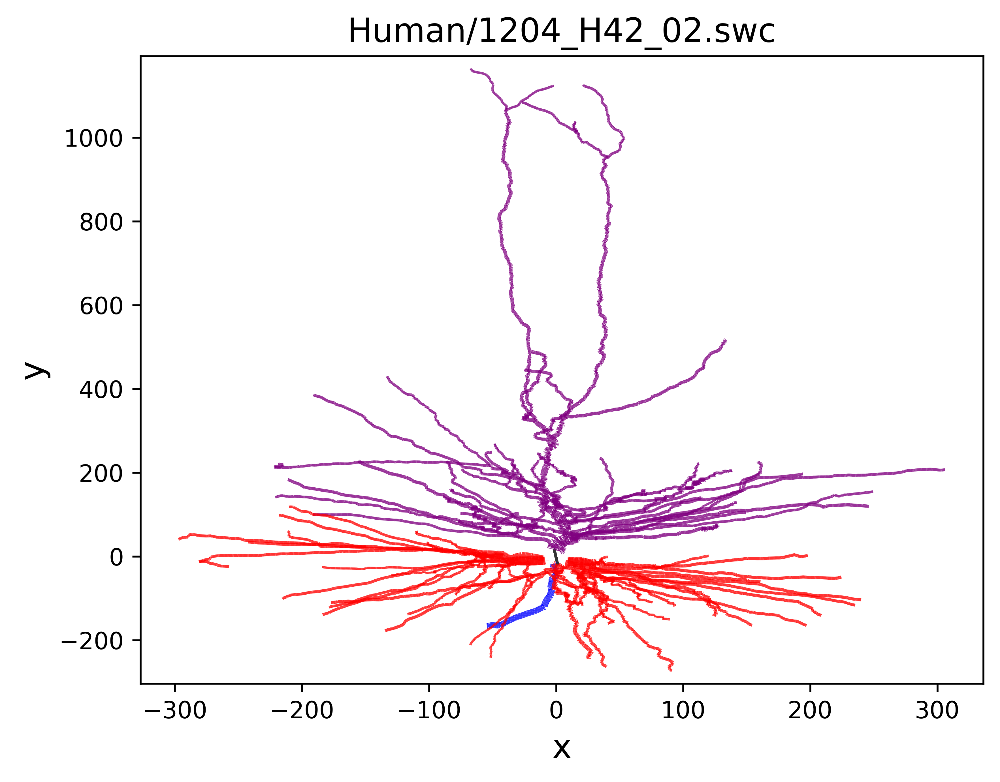

In [6]:
fig = plt.figure(figsize=(12,8))
view.neuron(rat_neuron)
view.neuron(mouse_neuron)
view.neuron(human_neuron)

## 3.3 Extract the topology (TMD) of a neuron

The Topological Morphology descriptor transfroms the complex tree structure of a neuron into a topological descriptor. The topological descriptor can be visualized as a persistence bardode, or a persistence diagram. For Machine Learning applications we also use vectorized versions of the TMD, such as a persistence image. 

In [7]:
rat_topology = tmd.methods.get_persistence_diagram(rat_neuron.apical_dendrite[0])
mouse_topology = tmd.methods.get_persistence_diagram(mouse_neuron.apical_dendrite[0])
human_topology = tmd.methods.get_persistence_diagram(human_neuron.apical_dendrite[0])

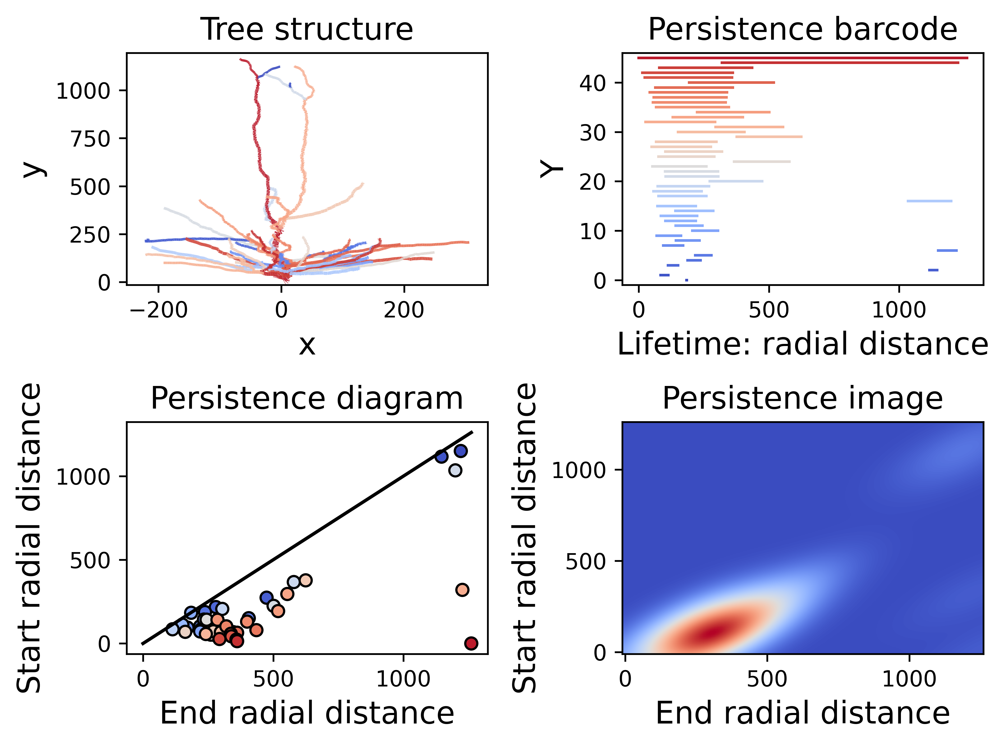

In [8]:
view.tree_full_persistence_colors(human_neuron.apical_dendrite[0], cmap=plt.cm.coolwarm)
plt.tight_layout()

## 3.4 Analyze the topology (TMD) of a neuron

### Topological Barcode

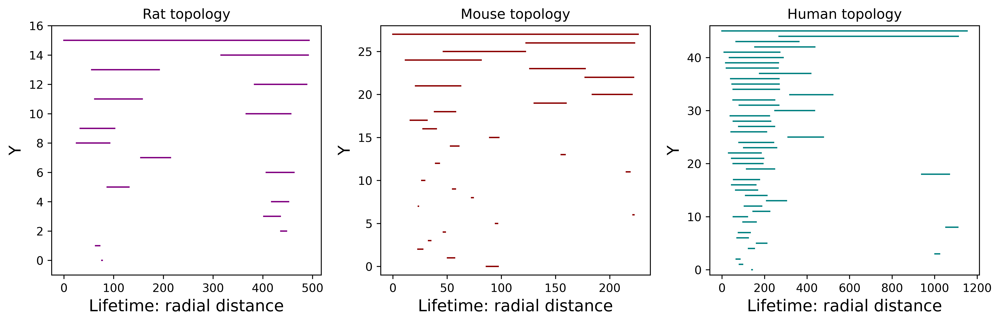

In [9]:
fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(131)
view.plot.barcode(rat_topology, new_fig=False, color='purple')
ax.set_title('Rat topology')

ax = fig.add_subplot(132)
view.plot.barcode(mouse_topology, new_fig=False, color='darkred')
ax.set_title('Mouse topology')

ax = fig.add_subplot(133)
view.plot.barcode(human_topology, new_fig=False, color='teal')
ax.set_title('Human topology')

plt.tight_layout()

### Topological Diagram

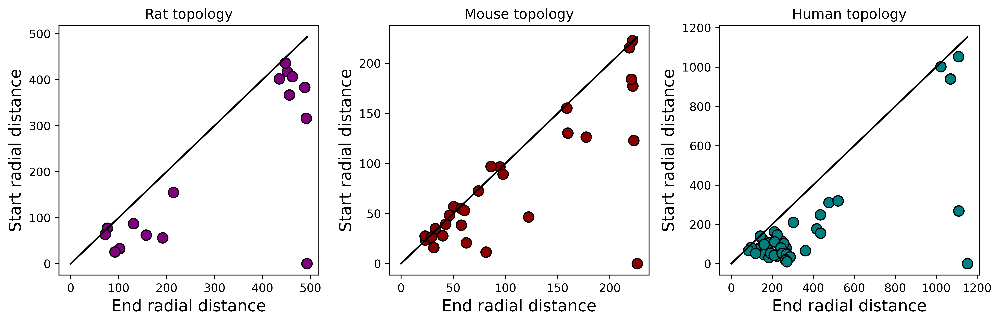

In [10]:
fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(131)
view.plot.diagram(rat_topology, new_fig=False, color='purple', s=80)
ax.set_title('Rat topology')

ax = fig.add_subplot(132)
view.plot.diagram(mouse_topology, new_fig=False, color='darkred', s=80)
ax.set_title('Mouse topology')

ax = fig.add_subplot(133)
view.plot.diagram(human_topology, new_fig=False, color='teal', s=80)
ax.set_title('Human topology')

plt.tight_layout()

### Topological Image

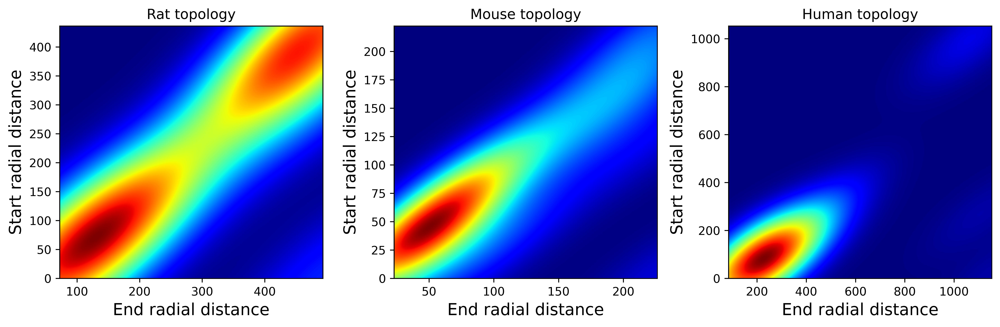

In [11]:
fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(131)
view.plot.persistence_image(rat_topology, new_fig=False, color='purple')
ax.set_title('Rat topology')

ax = fig.add_subplot(132)
view.plot.persistence_image(mouse_topology, new_fig=False, color='darkred')
ax.set_title('Mouse topology')

ax = fig.add_subplot(133)
view.plot.persistence_image(human_topology, new_fig=False, color='teal')
ax.set_title('Human topology')

plt.tight_layout()

Normalize scaling between species. 

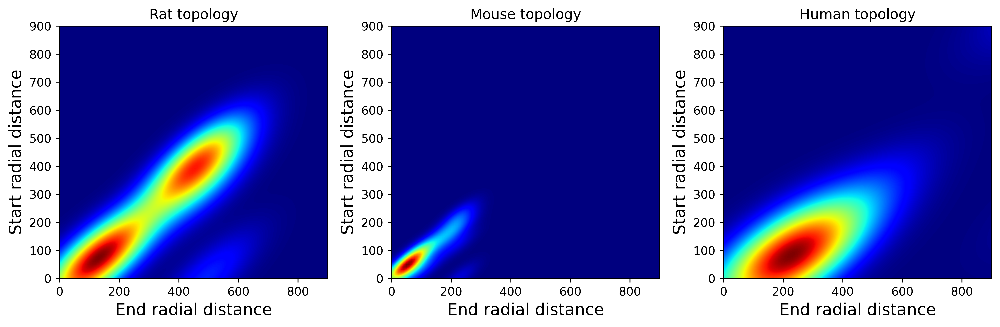

In [12]:
lim=(0, 900)

fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(131)
view.plot.persistence_image(rat_topology, new_fig=False, color='purple', xlim=lim, ylim=lim)
ax.set_title('Rat topology')

ax = fig.add_subplot(132)
view.plot.persistence_image(mouse_topology, new_fig=False, color='darkred', xlim=lim, ylim=lim)
ax.set_title('Mouse topology')

ax = fig.add_subplot(133)
view.plot.persistence_image(human_topology, new_fig=False, color='teal', xlim=lim, ylim=lim)
ax.set_title('Human topology')

plt.tight_layout()

## 3.5 Topological Comparison of the species

### Using persistence images of the whole dataset of Rat, Mouse, Human

In [13]:
phsR = [tmd.methods.get_persistence_diagram(n.apical_dendrite[0]) for n in Rat_morphologies.neurons]
phsM = [tmd.methods.get_persistence_diagram(n.apical_dendrite[0]) for n in Mouse_morphologies.neurons]
phsH = [tmd.methods.get_persistence_diagram(n.apical_dendrite[0]) for n in Human_morphologies.neurons]

#### Unnormalized Rat - Mouse difference

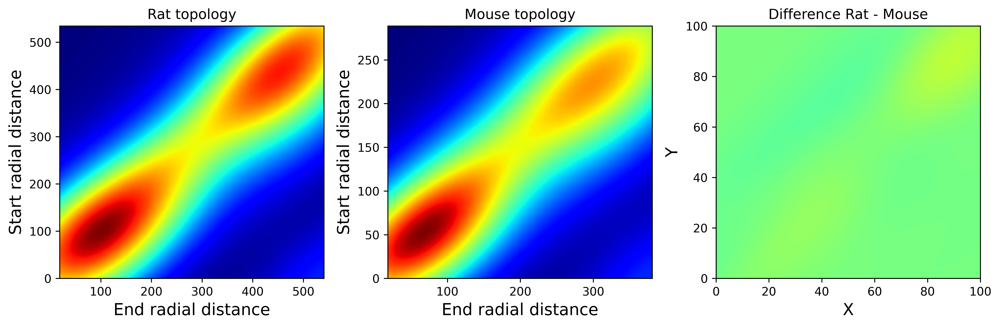

In [14]:
fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(131)
Z3 = view.plot.persistence_image_average(phsR, new_fig=False)[0]
ax.set_title('Rat topology')

ax = fig.add_subplot(132)
Z4 = view.plot.persistence_image_average(phsM, new_fig=False)[0]
ax.set_title('Mouse topology')

ax = fig.add_subplot(133)
_ = view.plot.persistence_image_diff(Z3, Z4, new_fig=False)
ax.set_title('Difference Rat - Mouse')

plt.tight_layout()

#### Normalized Rat - Mouse difference

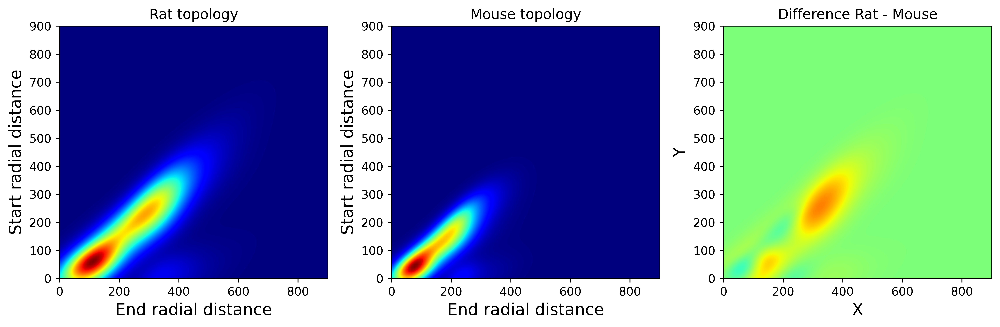

In [15]:
lim = (0, 900)
fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(131)
Z3 = view.plot.persistence_image_average(phsR, new_fig=False, xlim=lim, ylim=lim)[0]
ax.set_title('Rat topology')

ax = fig.add_subplot(132)
Z4 = view.plot.persistence_image_average(phsM, new_fig=False, xlim=lim, ylim=lim)[0]
ax.set_title('Mouse topology')

ax = fig.add_subplot(133)
_ = view.plot.persistence_image_diff(Z3, Z4, xlim=lim, ylim=lim, new_fig=False)
ax.set_title('Difference Rat - Mouse')

plt.tight_layout()

#### Normalized Human - Mouse difference

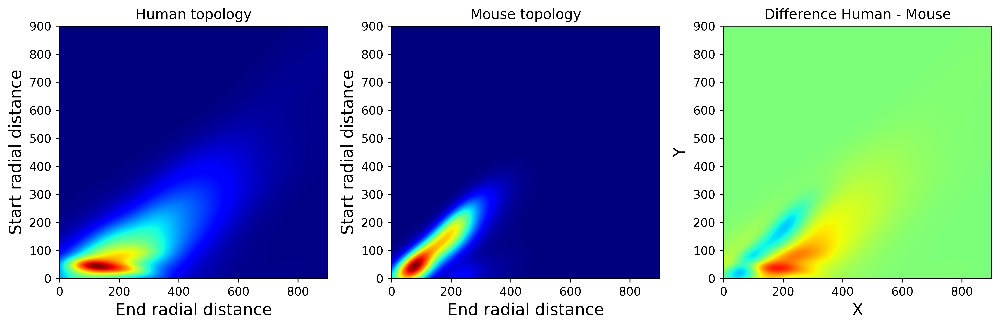

In [16]:
lim = (0, 900)
fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(131)
Z3 = view.plot.persistence_image_average(phsH, new_fig=False, xlim=lim, ylim=lim)[0]
ax.set_title('Human topology')

ax = fig.add_subplot(132)
Z4 = view.plot.persistence_image_average(phsM, new_fig=False, xlim=lim, ylim=lim)[0]
ax.set_title('Mouse topology')

ax = fig.add_subplot(133)
_ = view.plot.persistence_image_diff(Z3, Z4, xlim=lim, ylim=lim, new_fig=False)
ax.set_title('Difference Human - Mouse')

plt.tight_layout()

### Using persistence entropy 

The entropy is another topological vectorization that illustrates the complexity of the branching at different radial distances from the soma. It is similar to the Sholl analysis, but more precise, as it keeps the topological components and nto the intersection of branches with circles, it is also a measure of the 3 dimensional distribution of branches. 

### Comparison of the entropy between Rat and Mouse

In [17]:
lim = (0, 600)
bins = np.linspace(lim[0], lim[1], 300)

In [18]:
entropyR = [tmd.vectorizations.life_entropy_curve(p, bins=bins)[0] for p in phsR]
entropyM = [tmd.vectorizations.life_entropy_curve(p, bins=bins)[0] for p in phsM]

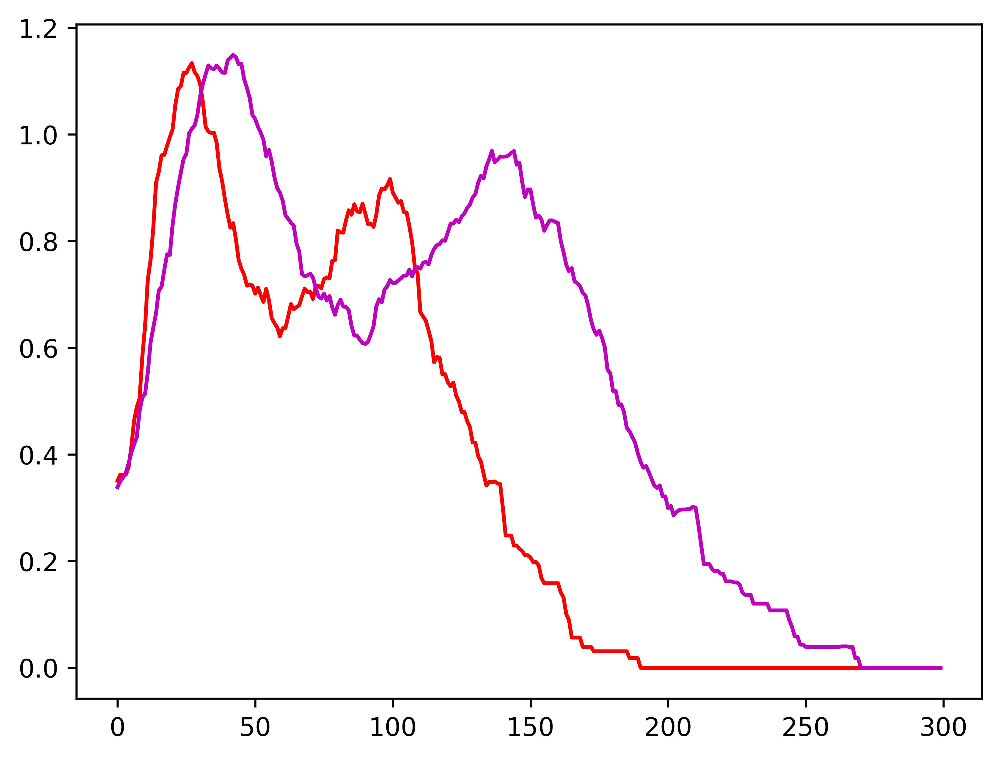

In [19]:
plt.plot(np.average(entropyM, axis=0), color='r')
plt.plot(np.average(entropyR, axis=0), color='m')

#### Normalization of entropies for mouse / rat

In [20]:
limM = (0, 400)
limR = (0, 600)
limH = (0, 900)

In [21]:
binsR = np.linspace(limR[0], limR[1], 300)
binsM = np.linspace(limM[0], limM[1], 300)

entropyR = [tmd.vectorizations.life_entropy_curve(p, bins=binsR)[0] for p in phsR]
entropyM = [tmd.vectorizations.life_entropy_curve(p, bins=binsM)[0] for p in phsM]

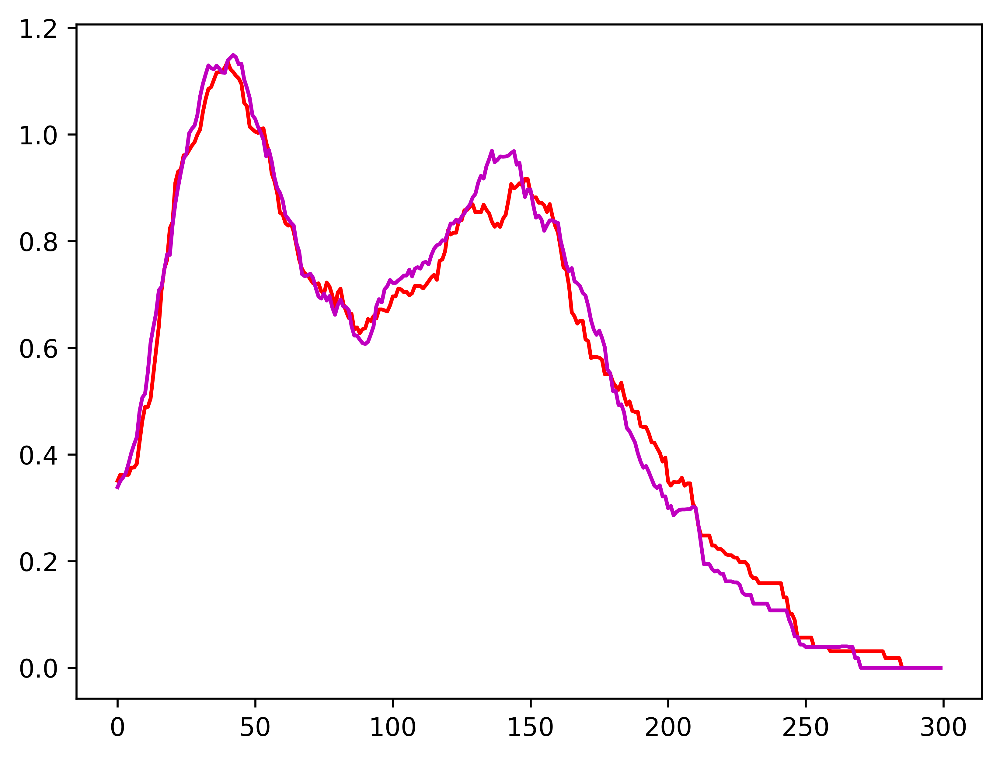

In [22]:
plt.plot(np.average(entropyM, axis=0), color='r')
plt.plot(np.average(entropyR, axis=0), color='m')

### Comparison of the entropy between Human and Mouse

In [23]:
lim = (0, 900)
bins = np.linspace(lim[0], lim[1], 300)

In [24]:
entropyH = [tmd.vectorizations.life_entropy_curve(p, bins=bins)[0] for p in phsH]
entropyM = [tmd.vectorizations.life_entropy_curve(p, bins=bins)[0] for p in phsM]

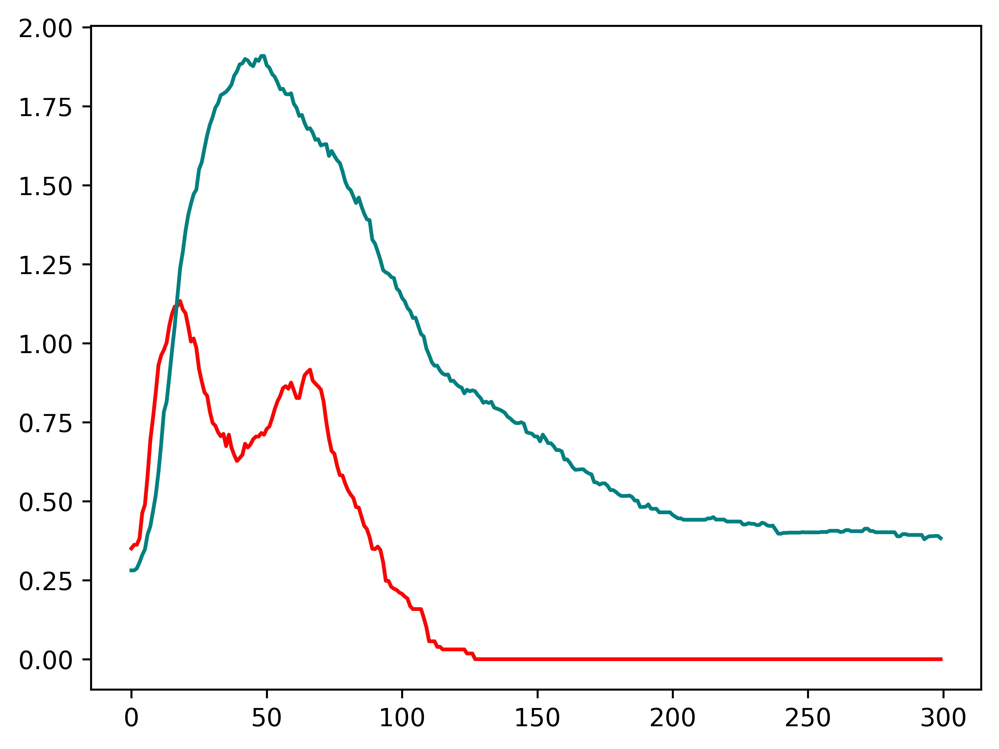

In [25]:
plt.plot(np.average(entropyM, axis=0), color='r')
plt.plot(np.average(entropyH, axis=0), color='teal')

#### Normalization of entropies for mouse / human

In [26]:
binsH = np.linspace(limH[0], limH[1], 300)
binsM = np.linspace(limM[0], limM[1], 300)

entropyH = [tmd.vectorizations.life_entropy_curve(p, bins=binsH)[0] for p in phsH]
entropyM = [tmd.vectorizations.life_entropy_curve(p, bins=binsM)[0] for p in phsM]

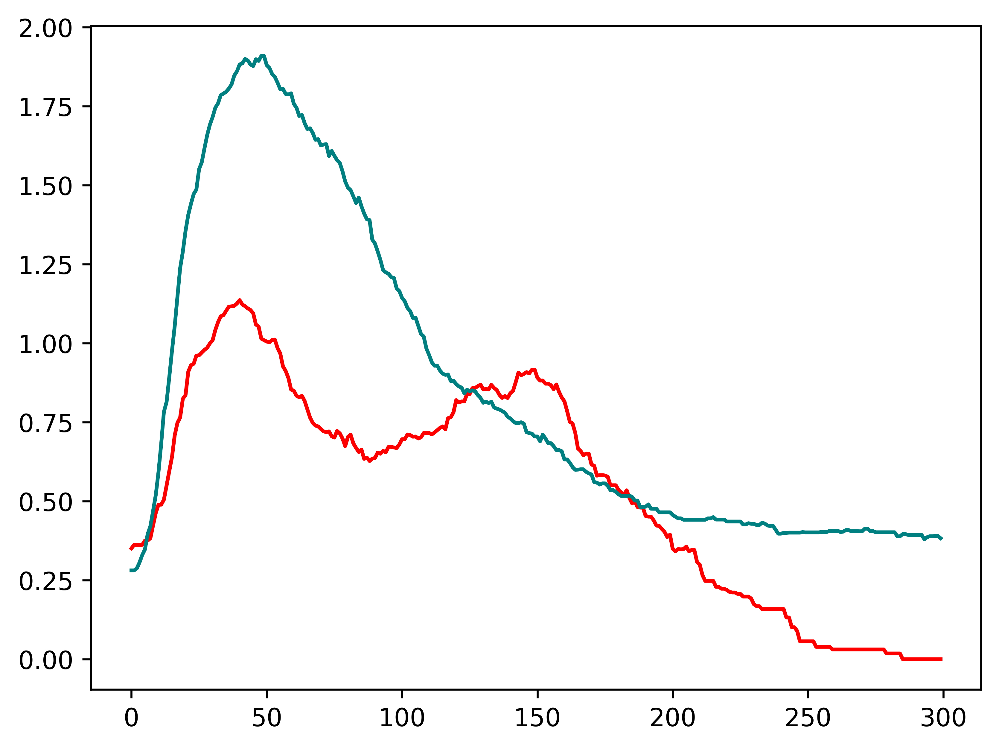

In [27]:
plt.plot(np.average(entropyM, axis=0), color='r')
plt.plot(np.average(entropyH, axis=0), color='teal')

### Using umap embedding

#### Embedding of mouse and rat unnormalized 

In [28]:
import umap

In [29]:
lim = (0, 600)

imgsR = [tmd.vectorizations.persistence_image_data(np.array(p)[:,:2], xlim=lim, ylim=lim, bw_method=0.5).flatten() for p in phsR]
imgsM = [tmd.vectorizations.persistence_image_data(np.array(p)[:,:2], xlim=lim, ylim=lim, bw_method=0.5).flatten() for p in phsM]

In [31]:
reducer = umap.UMAP(n_components=3, random_state=2025)
trainHA = reducer.fit(imgsR + imgsM)

/opt/tljh/user/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/tljh/user/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


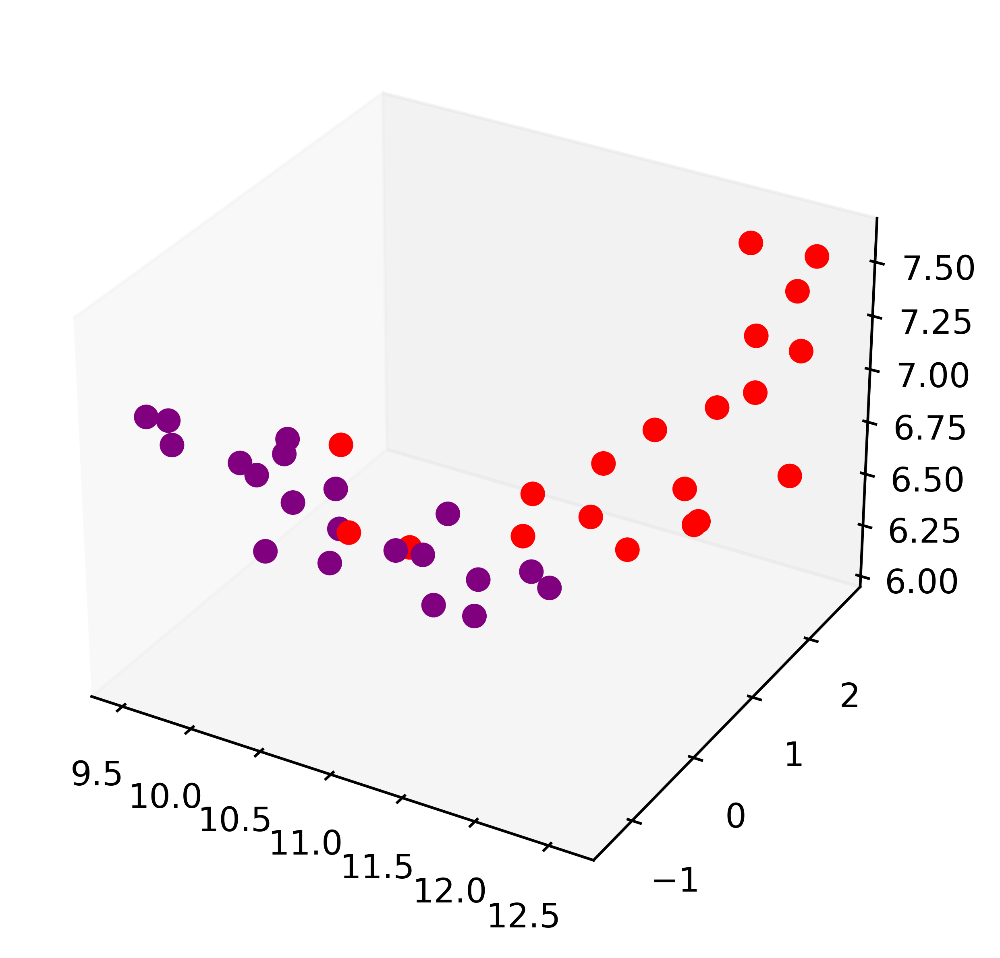

In [32]:
fig = plt.figure()
ax = plt.axes(projection="3d")
#fig.set_facecolor("darkslategrey")
#ax.set_facecolor("darkslategrey")
ax.grid(False)

ax.scatter3D(
    trainHA.embedding_[:, 0],
    trainHA.embedding_[:, 1],
    trainHA.embedding_[:, 2],
    alpha=1, 
    s=40,
    color= ['purple'] * len(imgsR) + ['red'] * len(imgsM)
)

#### Embedding of mouse and rat normalized 

In [33]:
imgsR = [tmd.vectorizations.persistence_image_data(np.array(p)[:,:2], xlim=limR, ylim=limR, bw_method=0.5).flatten() for p in phsR]
imgsM = [tmd.vectorizations.persistence_image_data(np.array(p)[:,:2], xlim=limM, ylim=limM, bw_method=0.5).flatten() for p in phsM]

In [34]:
reducer = umap.UMAP(n_components=3, random_state=2025)
trainHA = reducer.fit(imgsR + imgsM)

/opt/tljh/user/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/tljh/user/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


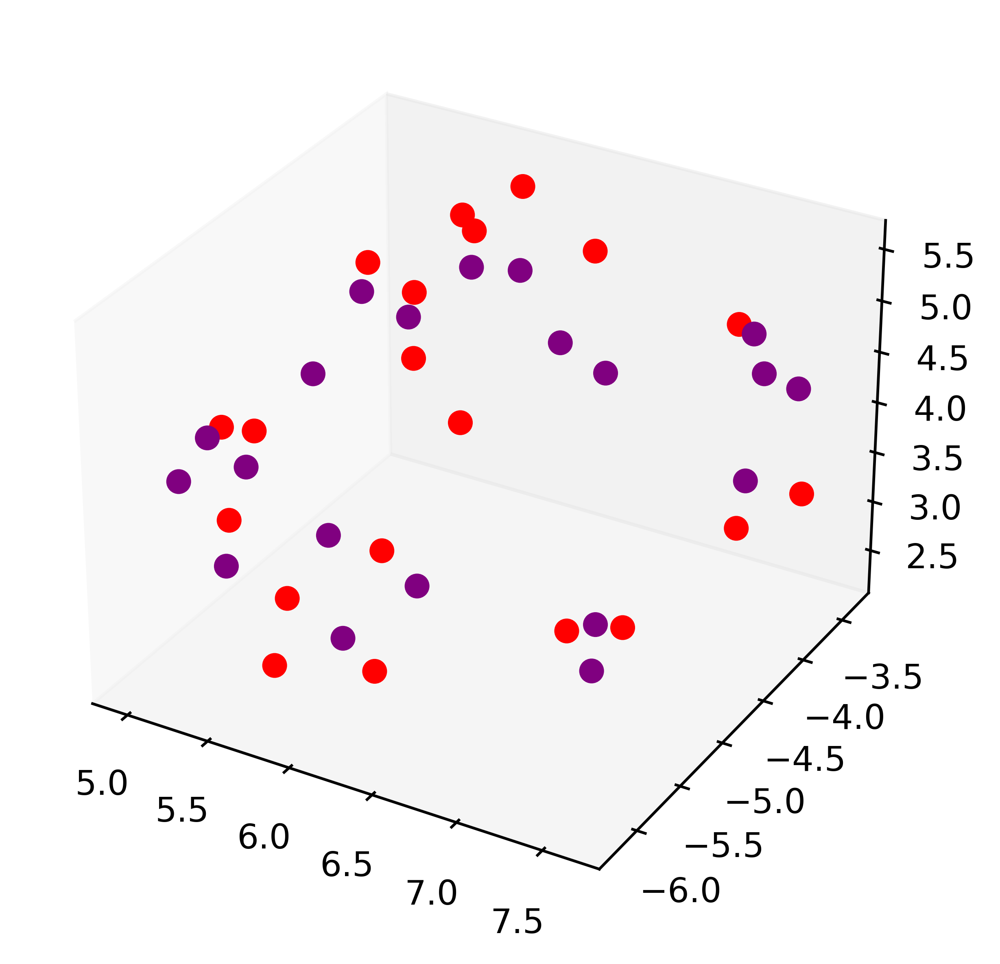

In [35]:
fig = plt.figure()
ax = plt.axes(projection="3d")
#fig.set_facecolor("darkslategrey")
#ax.set_facecolor("darkslategrey")
ax.grid(False)

ax.scatter3D(
    trainHA.embedding_[:, 0],
    trainHA.embedding_[:, 1],
    trainHA.embedding_[:, 2],
    alpha=1, 
    s=40,
    color= ['purple'] * len(imgsR) + ['red'] * len(imgsM)
)

#### Embedding of mouse and human unnormalized 

In [36]:
lim = (0, 900)

imgsH = [tmd.vectorizations.persistence_image_data(np.array(p)[:,:2], xlim=lim, ylim=lim, bw_method=0.5).flatten() for p in phsH]
imgsM = [tmd.vectorizations.persistence_image_data(np.array(p)[:,:2], xlim=lim, ylim=lim, bw_method=0.5).flatten() for p in phsM]

In [37]:
reducer = umap.UMAP(n_components=3, random_state=2025)
trainHA = reducer.fit(imgsH + imgsM)

/opt/tljh/user/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/tljh/user/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


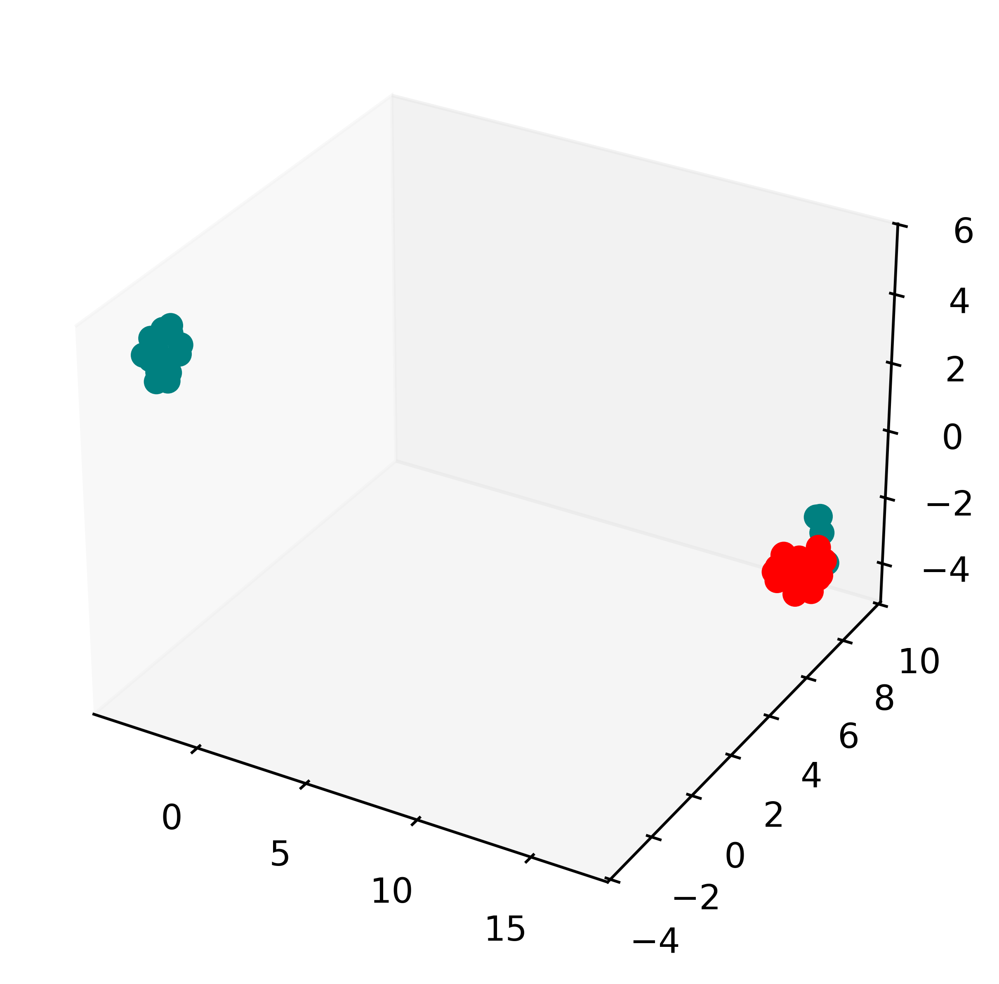

In [38]:
fig = plt.figure()
ax = plt.axes(projection="3d")
#fig.set_facecolor("darkslategrey")
#ax.set_facecolor("darkslategrey")
ax.grid(False)

ax.scatter3D(
    trainHA.embedding_[:, 0],
    trainHA.embedding_[:, 1],
    trainHA.embedding_[:, 2],
    alpha=1, 
    s=40,
    color= ['teal'] * len(imgsH) + ['red'] * len(imgsM)
)

#### Embedding of mouse and human normalized 

In [39]:
imgsH = [tmd.vectorizations.persistence_image_data(np.array(p)[:,:2], xlim=limH, ylim=limH, bw_method=0.5).flatten() for p in phsH]
imgsM = [tmd.vectorizations.persistence_image_data(np.array(p)[:,:2], xlim=limM, ylim=limM, bw_method=0.5).flatten() for p in phsM]

In [40]:
reducer = umap.UMAP(n_components=3, random_state=2025)
trainHA = reducer.fit(imgsH + imgsM)

/opt/tljh/user/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/tljh/user/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


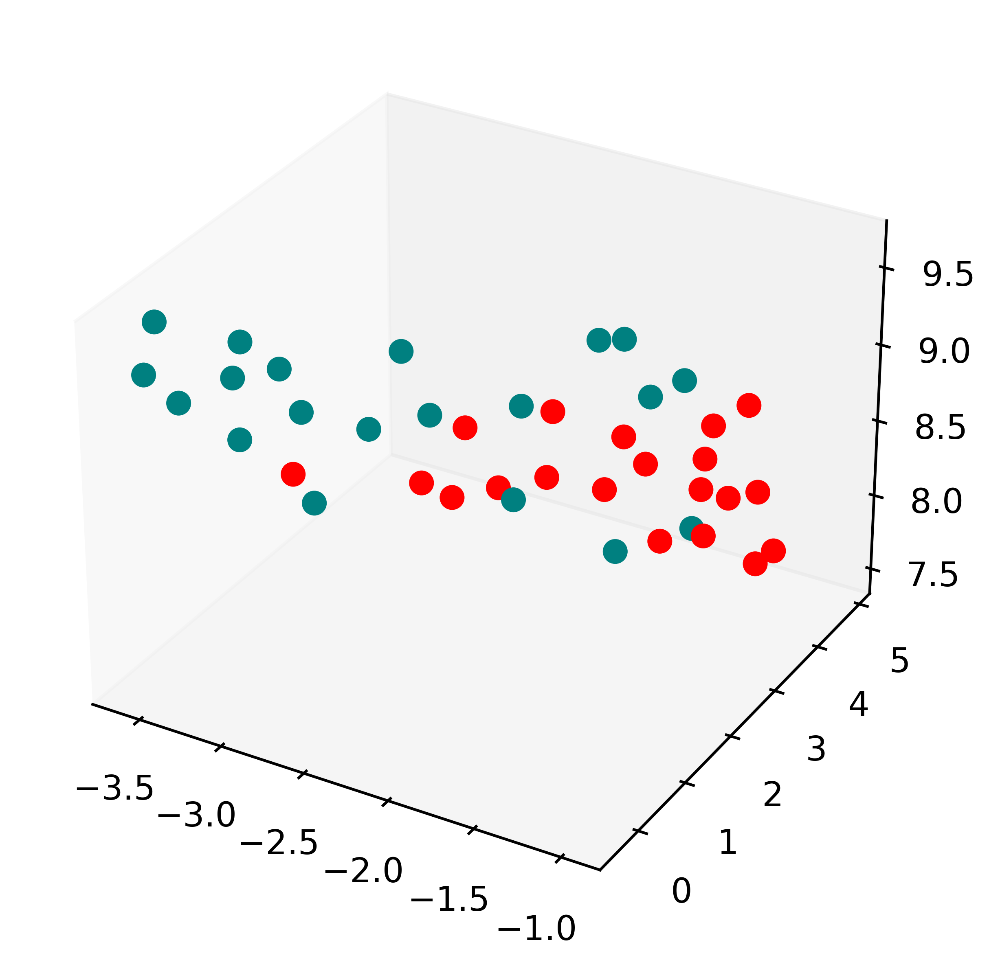

In [41]:
fig = plt.figure()
ax = plt.axes(projection="3d")
#fig.set_facecolor("darkslategrey")
#ax.set_facecolor("darkslategrey")
ax.grid(False)

ax.scatter3D(
    trainHA.embedding_[:, 0],
    trainHA.embedding_[:, 1],
    trainHA.embedding_[:, 2],
    alpha=1, 
    s=40,
    color= ['teal'] * len(imgsH) + ['red'] * len(imgsM)
)